<a href="https://colab.research.google.com/github/may-/joeys2t/blob/main/notebooks/joeyS2T_ASR_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# JoeyS2T ASR Tutorial


In this notebook, we'll train a Transformer model for transcribing Nigerian English ([OpenSLR70](https://huggingface.co/datasets/openslr)) audio. You'll have the option to choose other languages as well.


*Note: This tutorial is based on the material developed for AIMS [NMT in Practice](https://github.com/juliakreutzer/AMMI_NMT) lecture*, co-taught with [Julia Kreutzer](https://juliakreutzer.github.io/).


> ⚠ **Important:** Before you start, set the runtime type to GPU.
If no GPU is available, training will be slow, so I recommend you to reach out to use the pretrained model that you'll find at the end of this notebook for testing.

Author: Mayumi Ohta  
last update: 19 January 2024

## Installation



Check if your torch and torchaudio version is compatible with joeynmt v2.

In [1]:
import torch, torchaudio

torch.__version__, torchaudio.__version__

('2.1.0+cu121', '2.1.0+cu121')

Install JoeyS2T from https://github.com/may-/joeys2t.git

In [2]:
!pip install -q git+https://github.com/may-/joeys2t.git

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.3/106.3 kB 464.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.5/897.5 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.6/510.6 kB 30.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 38.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.2/275.2 kB 28.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.3/92.3 k

In order not to lose the model when colab disconnects, we store it and the data in Google Drive.

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Set some env variables for this tutorial:

In [4]:
%env HF_DATASETS_CACHE=/content/drive/MyDrive/.cache
%env WORK_DIR=/content/drive/MyDrive

env: HF_DATASETS_CACHE=/content/drive/MyDrive/.cache
env: WORK_DIR=/content/drive/MyDrive


## Data Preparation

In this tutorial, we use [OpenSLR](https://huggingface.co/datasets/openslr) dataset provided in Huggingface's datasets library. Let's inspect the [LR70](https://www.openslr.org/70/) subset.

In [5]:
from datasets import load_dataset

slr70 = load_dataset("openslr", name="SLR70", split="train", trust_remote_code=True)
slr70

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/datasets/load.py:1429: FutureWarning: The repository for openslr contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/openslr
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datasets`.
  warnings.warn(


Generating train split:   0%|          | 0/3359 [00:00<?, ? examples/s]

Dataset({
    features: ['path', 'audio', 'sentence'],
    num_rows: 3359
})

Each sample in this data has 'audio' content in .wav format and 'sentence' in string.

In [6]:
slr70[0]

{'path': '/content/drive/MyDrive/.cache/downloads/extracted/b6d80e3d8620aad8d9f7f2ec54d1c434779792688f74be9c4cd16f40e4b0d0ab/ngf_07049_01888062641.wav',
 'audio': {'path': '/content/drive/MyDrive/.cache/downloads/extracted/b6d80e3d8620aad8d9f7f2ec54d1c434779792688f74be9c4cd16f40e4b0d0ab/ngf_07049_01888062641.wav',
  'array': array([-1.22070312e-04, -1.22070312e-04, -1.22070312e-04, ...,
          6.10351562e-05,  6.10351562e-05,  6.10351562e-05]),
  'sampling_rate': 48000},
 'sentence': 'Create shortcuts to finish tasks faster'}

.wav format audio can be expressed as 1d-array, corresponds to the magnitude in milisecond.

In [7]:
slr70[0]['audio']['array'].shape

(172032,)

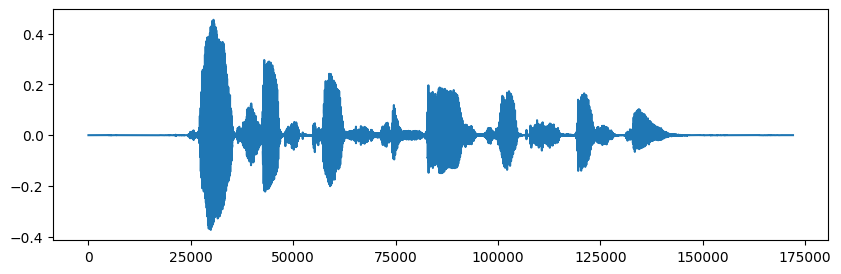

In [8]:
%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 3))
plt.plot(slr70[0]['audio']['array'])
plt.show()

You can listen the audio here!

In [9]:
from IPython.display import Audio, display

print(slr70[0]['sentence'])
Audio(slr70[0]['audio']['array'], rate=slr70[0]['audio']['sampling_rate'])

Create shortcuts to finish tasks faster


JoeyS2T requires tsv format input data, which should contain **filterbank features** (src) and **transcription text** (trg).

`scripts/prepare_openslr.py` shows how to prepare such a data. Let's run the script and inspect closer what will be created. (This step might take a while!)

In [10]:
!wget https://raw.githubusercontent.com/may-/joeys2t/main/scripts/audiodata_utils.py
!wget https://raw.githubusercontent.com/may-/joeys2t/main/scripts/prepare_openslr.py

--2024-01-19 13:39:30--  https://raw.githubusercontent.com/may-/joeys2t/main/scripts/audiodata_utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12240 (12K) [text/plain]
Saving to: ‘audiodata_utils.py’

audiodata_utils.py  100%[===================>]  11.95K  --.-KB/s    in 0s      

2024-01-19 13:39:30 (85.3 MB/s) - ‘audiodata_utils.py’ saved [12240/12240]

--2024-01-19 13:39:30--  https://raw.githubusercontent.com/may-/joeys2t/main/scripts/prepare_openslr.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4291 (4.2K) [text

In [11]:
!python prepare_openslr.py \
    --data_root $WORK_DIR/data \
    --dataset_name SLR70

2024-01-19 13:39:45.449110: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-19 13:39:45.449167: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-19 13:39:45.450650: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-19 13:39:45.459413: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-19 13:39:46.838115: W tensorflow/compiler/tf2

> 💡 **Note**:
> [OpenSLR](https://huggingface.co/datasets/openslr) dataset in Huggingface contains a lot of subsets. Try another subset out!

What is created in `data` dir?

```
data/
└── SLR70/
    ├── joey_all_data.tsv      # all splits (train, dev, test) together
    ├── {train|dev|test}.tsv   # input files for joeys2t
    ├── {train|dev|test}.txt   # text files (trascriptions)
    ├── fbank80/               # *.npy arrays are saved here
    │    ├── ngf_00295_00053583157.npy
    │    └── [...]
    ├── fbank80.zip            # audio features
    ├── spm_bpe1000.model      # sentencepiece model
    └── spm_bpe1000.vocab      # sentencepiece vocab
```
There are 3360 data points in totall, and we split them into train-dev-test.

In [12]:
!wc -l $WORK_DIR/data/SLR70/*.tsv

     9 /content/drive/MyDrive/data/SLR70/dev.tsv
  3360 /content/drive/MyDrive/data/SLR70/joey_all_data.tsv
     8 /content/drive/MyDrive/data/SLR70/test.tsv
  3345 /content/drive/MyDrive/data/SLR70/train.tsv
  6722 total


`fbank80` folder contains filterbank features in 2d-numpy array format.

In [13]:
from pathlib import Path
import numpy as np
import os

work_dir = Path(os.environ['WORK_DIR'])

fbank = np.load((work_dir / 'data/SLR70/fbank80/ngf_00295_00053583157.npy').as_posix())
fbank.shape

(450, 80)

In [14]:
fbank

array([[4.84975513, 4.49535368, 3.86247684, ..., 7.07198856, 7.19296191,
        7.19482771],
       [4.57995938, 4.19628788, 3.68917077, ..., 6.95174603, 6.82061415,
        6.50930684],
       [3.96443847, 5.21226666, 5.83552225, ..., 6.83495793, 7.42345402,
        7.73927419],
       ...,
       [5.03714906, 6.16916393, 5.61441864, ..., 7.04115856, 7.37384765,
        7.36677382],
       [4.17293652, 5.37413024, 5.47113544, ..., 6.77004959, 7.00783742,
        7.31540464],
       [3.12036697, 4.58703843, 4.65114721, ..., 6.5002706 , 6.84963992,
        7.00916419]])

You can see this 2d-array as a "heatmap". The second dimension (y-axis) we introduced here means "Frequency" property of sound that determines "Pitch". The x-axis is no longer "miliseconds", but "Frames".

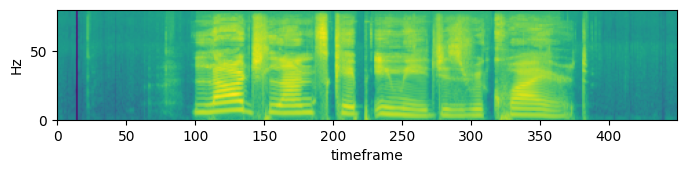

In [15]:
def plot_spectrogram(x, figsize=(8, 16)):
    plt.figure(figsize=figsize)
    plt.imshow(x.T)
    plt.ylim((0, 80))
    plt.ylabel('Hz')
    plt.xlabel('timeframe')
    plt.show()

plot_spectrogram(fbank)

These numpy arrays take much memory, so we compress them a bit, and make the compressed file accessible via offset.

The input tsv files usually has 4 columns: `id`, `src`, `n_frames`, and `trg`. (In this SLR32 particular case, the language information is also included, but it's optional.)

In [16]:
from audiodata_utils import load_tsv

slr70_test = load_tsv(work_dir / "data/SLR70/test.tsv")
slr70_test

,id,src,n_frames,trg
0,ngf_05223_02011381231,fbank80.zip:189260557:763648,1193,Uruguayan cuisine is a fusion of several Europ...
1,ngf_01208_01477062775,fbank80.zip:400028362:244608,382,Ejokparoghene shared a contact with you.
2,ngf_08421_01992637729,fbank80.zip:496849152:675968,1056,The refractive index of air depends on tempera...
3,ngf_07508_02027580302,fbank80.zip:575342346:725248,1133,The Yoruba People occupy South Western and Nor...
4,ngf_07049_00925741487,fbank80.zip:620147025:206208,322,Turn left towards Ebonyi Layout Road
5,ngf_12484_00372950096,fbank80.zip:709743951:140928,220,"Sorry, who do you want to call?"
6,ngm_02484_01457928650,fbank80.zip:848261120:227968,356,As you dance jump up as high as you can


The string in the `src` column refers basically the compressed filename and the offset.

For example, `fbank80.zip:640457251:381888` tells you: the data of this instance (`ngf_05223_02011381231.npy`) stands in the `fbank80.zip` file, starting at `640457251` and has length of `381888`.

The `n_frames` column represents the length of the filterbank (along x-axis).

The `trg` column is the ground truth label, the correct signal the model will learn from.

> 📝 **Note** Once you created the compressed fbank80.zip, you can safely delete uncompressed fbank80 dir and all *.npy files in it. It will free a lot of disk space!

## Configuration

JoeyS2T also reads model and training hyperparameters from a configuration file. The configuration options are slightly different, though.

Can you tell which part is new for JoeyS2T? Let's figure out together!

In [17]:
data_path = work_dir / 'data/SLR70'
experiment_dir = work_dir / 'models/openslr_SLR70'

config = """
name: "openslr_SLR70"
joeynmt_version: 2.3.0
task: "S2T"                         # "S2T" for speech-to-text, "MT" for (text) translation
model_dir: "{experiment_dir}"
use_cuda: True
fp16: True
random_seed: 123

data:
    train: "{data_dir}/train"
    dev:   "{data_dir}/dev"
    test:  "{data_dir}/test"
    dataset_type: "speech"          # SpeechDataset takes tsv as input
    src:
        lang: "en_ng"
        num_freq: 80                # number of frequencies of audio inputs
        max_length: 3000            # much longer than text sequence!
        min_length: 10              # have to be specified so that 1d-conv works!
        level: "frame"              # filterbank frames
        tokenizer_type: "speech"
        tokenizer_cfg:
            specaugment:            # SpecAugment config
                freq_mask_n: 1
                freq_mask_f: 5
                time_mask_n: 1
                time_mask_t: 10
                time_mask_p: 1.0
            cmvn:                   # CMVN config
                norm_means: True
                norm_vars: True
                before: True
    trg:
        lang: "en_ng"
        max_length: 100
        lowercase: False
        level: "bpe"                # bpe tokens
        voc_file: "{data_dir}/spm_bpe1000.vocab"
        tokenizer_type: "sentencepiece"
        tokenizer_cfg:
            model_file: "{data_dir}/spm_bpe1000.model"
            pretokenize: "none"
    special_symbols:
        unk_token: "<unk>"
        unk_id: 0
        pad_token: "<pad>"
        pad_id: 1
        bos_token: "<s>"
        bos_id: 2
        eos_token: "</s>"
        eos_id: 3

testing:
    load_model: "{experiment_dir}/best.ckpt"
    n_best: 1
    beam_size: 5
    beam_alpha: 1.0
    batch_size: 4
    batch_type: "sentence"
    max_output_length: 100          # Don't generate translations longer than this number of tokens.
    eval_metrics: ["wer"]           # Use "wer" for ASR task, "bleu" for ST task
    sacrebleu_cfg:                  # sacrebleu options
        tokenize: "intl"            # `tokenize` option in sacrebleu.corpus_bleu() function (options include: "none" (use for already tokenized test data), "13a" (default minimal tokenizer), "intl" which mostly does punctuation and unicode, etc)
        lowercase: True

training:
    #load_model: "{experiment_dir}/latest.ckpt" # if uncommented, load a pre-trained model from this checkpoint
    random_seed: 42
    optimizer: "adamw"
    normalization: "tokens"
    adam_betas: [0.9, 0.98]
    scheduling: "plateau"
    patience: 5
    learning_rate: 0.0002
    learning_rate_min: 0.00000001
    weight_decay: 0.0
    label_smoothing: 0.1
    loss: "crossentropy-ctc"       # use CrossEntropyLoss + CTCLoss
    ctc_weight: 0.3                # ctc weight in interpolation
    batch_size: 4
    batch_type: "sentence"
    batch_multiplier: 1
    early_stopping_metric: "wer"
    epochs: 10
    validation_freq: 1000
    logging_freq: 100
    overwrite: False
    shuffle: True
    print_valid_sents: [0, 1, 2, 3]
    keep_best_ckpts: 2

model:
    initializer: "xavier_uniform"
    bias_initializer: "zeros"
    init_gain: 1.0
    embed_initializer: "xavier_uniform"
    embed_init_gain: 1.0
    tied_embeddings: False       # Disable embeddings sharing between encoder(audio) and decoder(text)
    tied_softmax: False
    encoder:
        type: "transformer"
        num_layers: 12           # Common to use doubly bigger encoder than decoder in S2T.
        num_heads: 4
        embeddings:
            embedding_dim: 80    # Must be same as the frequency of the filterbank features!
        # typically ff_size = 4 x hidden_size
        hidden_size: 256
        ff_size: 1024
        dropout: 0.1
        layer_norm: "pre"
        activation: "relu"
        # new for S2T:
        subsample: True           # enable 1d conv module
        conv_kernel_sizes: [5, 5] # convolution kernel sizes (window width)
        conv_channels: 512        # convolution channels
        in_channels: 80           # Must be same as the embedding_dim
    decoder:
        type: "transformer"
        num_layers: 6
        num_heads: 4
        embeddings:
            embedding_dim: 256
            scale: True
            dropout: 0.0
        # typically ff_size = 4 x hidden_size
        hidden_size: 256
        ff_size: 1024
        dropout: 0.1
        layer_norm: "pre"
        activation: "relu"
""".format(data_dir=data_path.as_posix(),
           experiment_dir=experiment_dir.as_posix())

(data_path / 'config.yaml').write_text(config)

4760

## Training

Now we are ready to start training.

In [18]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard

In [19]:
%tensorboard --logdir {experiment_dir.as_posix()}/tensorboard

<IPython.core.display.Javascript object>

In [47]:
!python -m joeynmt train $WORK_DIR/data/SLR70/config.yaml --skip-test

2024-01-19 14:36:19.001204: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-19 14:36:19.001264: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-19 14:36:19.002815: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-19 14:36:19.010720: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-19 14:36:20.449903: W tensorflow/compiler/tf2

**Exercises**

🖊 Write down your notes in the cell below.


1. Which "Tokenizer" object is constructed? (Search line with `joeynmt.tokenizers` in the train.log!)
2. Which "Dataset" object is constructed?
3. Can you find any difference in the "Model" object from the Model we used for text translation?
4. Try updating the tensorboard above (reload button in the right corner). Is it showing some *plots* now? Can you see training batch loss going down? Which loss contributes more to the totall batch loss, NLL Loss or CTC Loss?
5. How the learning rate curve on tensorboard looks like? Can you tell why?
6. Find out what the *WER* scores are after intermediate validations. Does it reflect the quality differences between model hypotheses (outputs) and references that are logged in the training log? (Recall that lower is better in WER!)
6. Take a look at the model outputs as the model is getting better. You can find them in the `.hyps` files in the model directory. Are there any patterns to be observed how the model is progressing? Anything that seems particularly easy or hard to pick up?

Once you feel like you've seen enough and you'd like to try out the trained model (wait at least 3 epochs), interrupt training by stopping the cell and proceed below.

## Evaluation

It's not easy to interactively try a few audio examples, because you have to first record your speech, and extract the features from the saved audio file. Currently, `translate` mode is not available for S2T experiments.

You can still use the `test` mode for S2T to generate the transcriptions.

In [48]:
!python -m joeynmt test $WORK_DIR/data/SLR70/config.yaml

2024-01-19 15:08:55.975825: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-19 15:08:55.975897: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-19 15:08:55.977513: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-19 15:08:55.985761: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-19 15:08:57.358582: W tensorflow/compiler/tf2

It might be difficult to see improvements in such a small dataset. Unfotunately, data requirement for S2T modeling seems much severer than text MT. Google Colab GPU usually doesn't suffice to train a reasonably large S2T model.

> ⚠ **Warning**
> The 1d-conv layer may raise an error for too short audio inputs, since the layer cannot convolve the frames shorter than the kernel size. Please make sure that your inputs have the frames longer than `conv_kernel_sizes` values in the model section of your config.

## Working with a Pretrained Model

Here you can try a pretrained model on the [LibriSpeech](https://www.openslr.org/12) corpus.
This model is trained on 960h audio books in English and achieved WER 3.78 on test-clean, 8.32 on test-other set.

In [49]:
!wget -O $WORK_DIR/models/librispeech960h.tar.gz https://cl.uni-heidelberg.de/statnlpgroup/joeynmt2/librispeech960h.tar.gz
!cd $WORK_DIR/models/ && tar xvf librispeech960h.tar.gz

--2024-01-19 15:11:32--  https://cl.uni-heidelberg.de/statnlpgroup/joeynmt2/librispeech960h.tar.gz
Resolving cl.uni-heidelberg.de (cl.uni-heidelberg.de)... 147.142.207.78
Connecting to cl.uni-heidelberg.de (cl.uni-heidelberg.de)|147.142.207.78|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.cl.uni-heidelberg.de/statnlpgroup/joeynmt2/librispeech960h.tar.gz [following]
--2024-01-19 15:11:34--  https://www.cl.uni-heidelberg.de/statnlpgroup/joeynmt2/librispeech960h.tar.gz
Resolving www.cl.uni-heidelberg.de (www.cl.uni-heidelberg.de)... 147.142.207.78
Connecting to www.cl.uni-heidelberg.de (www.cl.uni-heidelberg.de)|147.142.207.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1126112784 (1.0G) [application/x-gzip]
Saving to: ‘/content/drive/MyDrive/models/librispeech960h.tar.gz’

/content/drive/MyDr 100%[===================>]   1.05G  24.6MB/s    in 45s     

2024-01-19 15:12:20 (24.0 MB/s) - ‘/content/drive/MyDrive/mode

There, a sample test data file is included. The `src` column can contain a path to raw audio files, instead of extracted fbank features.

In [50]:
librispeech_path = work_dir / 'models/librispeech960h'
librispeech_test_small = load_tsv(librispeech_path / "joey_test-small.tsv")
librispeech_test_small

,id,src,n_frames,trg,speaker
0,260-123440-0,wav/260-123440-0.wav,215,and how odd the directions will look,260
1,260-123440-1,wav/260-123440-1.wav,172,poor alice,260
2,260-123440-2,wav/260-123440-2.wav,1470,it was the white rabbit returning splendidly d...,260
3,260-123440-3,wav/260-123440-3.wav,357,oh won't she be savage if i've kept her waiting,260
4,260-123440-4,wav/260-123440-4.wav,1200,alice took up the fan and gloves and as the ha...,260
5,260-123440-5,wav/260-123440-5.wav,309,and yesterday things went on just as usual,260
6,260-123440-6,wav/260-123440-6.wav,270,i wonder if i've been changed in the night,260
7,260-123440-7,wav/260-123440-7.wav,337,i almost think i can remember feeling a little...,260
8,260-123440-8,wav/260-123440-8.wav,373,i'll try if i know all the things i used to know,260
9,260-123440-9,wav/260-123440-9.wav,310,i shall never get to twenty at that rate,260


Rename the path, and call joeynmt in test mode. Additionally, save the token-wise probability and check where the model is more confident and where less confident.

In [51]:
config = (librispeech_path / 'config.yaml').read_text() \
    .replace("librispeech960h", librispeech_path.as_posix()) \
    .replace("beam_size: 20", "beam_size: 1") \
    .replace('return_prob: "none"', 'return_prob: "hyp"') \

(librispeech_path / 'new_config.yaml').write_text(config)

10088

In [86]:
!python -m joeynmt test $WORK_DIR/models/librispeech960h/new_config.yaml \
    --save-scores --output-path $WORK_DIR/models/librispeech960h/hyp

2024-01-19 15:57:43.293709: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-19 15:57:43.293772: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-19 15:57:43.295467: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-19 15:57:43.303689: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-19 15:57:44.693869: W tensorflow/compiler/tf2

> 📝 **Note**
> If you see out-of-memory error, try to reduce the batch_size!

The transcriptions are indeed not so bad!

In [89]:
from IPython.display import Audio, HTML, display

import numpy as np

def print_results(wav_path, ref, hyp, hyp_tokens, hyp_scores):
    print(' Reference:', ref, '\n')
    print('Hypothesis:', hyp, '\n')
    html = '<span style="margin-right: 3em;"></span>'
    for t, s in zip(hyp_tokens, hyp_scores):
        s = 1 - np.exp(s)
        html += f'<span style="background-color: rgba(255, 0, 0, {s}); margin-right: 5pt;">{t}</span>'
    html += '<br><br>'
    display(HTML(html))
    display(Audio((librispeech_path / wav_path).as_posix()))
    print('\n', '-'*20, '\n')

def read_hyp(hyp_path):
    hyp = (librispeech_path / hyp_path).read_text().splitlines()
    if hyp_path.endswith('tokens') or hyp_path.endswith('scores'):
        hyp = [eval(s) for s in hyp]
    return hyp

librispeech_test_small['hyp'] = read_hyp('hyp.test')
librispeech_test_small['hyp_tokens'] = read_hyp('hyp.test.tokens')
librispeech_test_small['hyp_scores'] = read_hyp('hyp.test.scores')

for name, row in librispeech_test_small.iterrows():
    print_results(row['src'], row['trg'], row['hyp'], row['hyp_tokens'], row['hyp_scores'])

 Reference: and how odd the directions will look 

Hypothesis: and how odd the directions will look 




 -------------------- 

 Reference: poor alice 

Hypothesis: poor alice 




 -------------------- 

 Reference: it was the white rabbit returning splendidly dressed with a pair of white kid gloves in one hand and a large fan in the other he came trotting along in a great hurry muttering to himself as he came oh the duchess the duchess 

Hypothesis: it was the white rabbit returning splendidly dressed with a pair white kid gloves in one hand and a large fan in the other he came trotting along in a great hurry muttering to himself as he came oh the duchess the duchess 




 -------------------- 

 Reference: oh won't she be savage if i've kept her waiting 

Hypothesis: oh won't she be savage if i've kept her waiting 




 -------------------- 

 Reference: alice took up the fan and gloves and as the hall was very hot she kept fanning herself all the time she went on talking dear dear how queer everything is to day 

Hypothesis: alice took up the fan and gloves and as the hall was very hot she kept fanning herself all the time she went on talking dear dear how queer everything is to day 




 -------------------- 

 Reference: and yesterday things went on just as usual 

Hypothesis: and yesterday things went on just as usual 




 -------------------- 

 Reference: i wonder if i've been changed in the night 

Hypothesis: i wonder if i've been changed in the night 




 -------------------- 

 Reference: i almost think i can remember feeling a little different 

Hypothesis: i almost think i can remember feeling a little different 




 -------------------- 

 Reference: i'll try if i know all the things i used to know 

Hypothesis: i'll try if i know all the things i used to know 




 -------------------- 

 Reference: i shall never get to twenty at that rate 

Hypothesis: i shall never get to twenty at that rate 




 -------------------- 

 Reference: how cheerfully he seems to grin how neatly spread his claws and welcome little fishes in with gently smiling jaws 

Hypothesis: how cheerfully he seems to grin how neatly spread his claws and welcomed little fishes in with gently smiling jaws 




 -------------------- 

 Reference: no i've made up my mind about it if i'm mabel i'll stay down here 

Hypothesis: no i've made up my mind about it if i'm mabel i'll stay down here 




 -------------------- 

 Reference: it'll be no use their putting their heads down and saying come up again dear 

Hypothesis: it'll be no use they're putting their heads down and saying come up again dear 




 -------------------- 

 Reference: i am so very tired of being all alone here 

Hypothesis: i am so very tired of being all alone here 




 -------------------- 

 Reference: and i declare it's too bad that it is 

Hypothesis: and i declare it's too bad that it is 




 -------------------- 

 Reference: i wish i hadn't cried so much said alice as she swam about trying to find her way out 

Hypothesis: i wish i hadn't cried so much said alice as she swam about trying to find her way out 




 -------------------- 

 Reference: i shall be punished for it now i suppose by being drowned in my own tears 

Hypothesis: i shall be punished for it now i suppose by being drowned in my own tears 




 -------------------- 

 Reference: that will be a queer thing to be sure 

Hypothesis: that will be a queer thing to be sure 




 -------------------- 

 Reference: i am very tired of swimming about here o mouse 

Hypothesis: i am very tired of swimming about here oh mouse 




 -------------------- 

 Reference: cried alice again for this time the mouse was bristling all over and she felt certain it must be really offended 

Hypothesis: cried alice again for this time the mouse was bristling all over and she felt certain it must be really offended 




 -------------------- 

 Reference: we won't talk about her any more if you'd rather not we indeed 

Hypothesis: we won't talk about her any more if you'd rather not we indeed 




 -------------------- 



*Note: tokens with lower scores are marked in dark red.*